<a href="https://colab.research.google.com/github/sallylee0801/Predicting-Building-Features-for-Energy-Cost-Reduction/blob/main/Final_Project_v5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ADSP 31010 Final Project**

## **Team 6 - Sally Lee, Kevin Ko, Vanessa Leal, Lin Sabones**

## **Data Pre-processing & Feature Engineering**

### **Import Libraries and Mount Directory**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split

### **Import Data**

In [ ]:
# Mount to google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import data
data = pd.read_csv('/content/drive/MyDrive/Linear & Non Linear Models/Final Project_Raw Dataset/train.csv')
# data = pd.read_csv('/content/drive/MyDrive/Linear Non Linear Models/train.csv')

In [ ]:
data.head()

,Year_Factor,State_Factor,building_class,facility_type,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
0,1,State_1,Commercial,Grocery_store_or_food_market,61242.0,1942.0,11.0,2.4,36,50.5,...,14,0,0,0,1.0,1.0,1.0,NaN,248.682615,0
1,1,State_1,Commercial,Warehouse_Distribution_or_Shipping_center,274000.0,1955.0,45.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,26.500150,1
2,1,State_1,Commercial,Retail_Enclosed_mall,280025.0,1951.0,97.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,24.693619,2
3,1,State_1,Commercial,Education_Other_classroom,55325.0,1980.0,46.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,48.406926,3
4,1,State_1,Commercial,Warehouse_Nonrefrigerated,66000.0,1985.0,100.0,2.4,36,50.5,...,14,0,0,0,1.0,1.0,1.0,NaN,3.899395,4


### **Data Summary**

In [ ]:
data.count()

Year_Factor                  75757
State_Factor                 75757
building_class               75757
facility_type                75757
floor_area                   75757
                             ...  
direction_peak_wind_speed    33946
max_wind_speed               34675
days_with_fog                29961
site_eui                     75757
id                           75757
Length: 64, dtype: int64

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75757 entries, 0 to 75756
Data columns (total 64 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Year_Factor                75757 non-null  int64  
 1   State_Factor               75757 non-null  object 
 2   building_class             75757 non-null  object 
 3   facility_type              75757 non-null  object 
 4   floor_area                 75757 non-null  float64
 5   year_built                 73920 non-null  float64
 6   energy_star_rating         49048 non-null  float64
 7   ELEVATION                  75757 non-null  float64
 8   january_min_temp           75757 non-null  int64  
 9   january_avg_temp           75757 non-null  float64
 10  january_max_temp           75757 non-null  int64  
 11  february_min_temp          75757 non-null  int64  
 12  february_avg_temp          75757 non-null  float64
 13  february_max_temp          75757 non-null  int

### **EDA - Summary Statistics**

In [ ]:
# Convert all columns to lowercase
data.columns = map(str.lower, data.columns)

# Summary statistics for numerical columns
summary_statistics = data.describe()
print("Summary Statistics for Numerical Columns:")
print(summary_statistics[['floor_area', 'year_built', 'energy_star_rating', 'elevation', 'site_eui']], '\n')

Summary Statistics for Numerical Columns:
         floor_area    year_built  energy_star_rating     elevation  \
count  7.575700e+04  73920.000000        49048.000000  75757.000000   
mean   1.659839e+05   1952.306764           61.048605     39.506323   
std    2.468758e+05     37.053619           28.663683     60.656596   
min    9.430000e+02      0.000000            0.000000     -6.400000   
25%    6.237900e+04   1927.000000           40.000000     11.900000   
50%    9.136700e+04   1951.000000           67.000000     25.000000   
75%    1.660000e+05   1977.000000           85.000000     42.700000   
max    6.385382e+06   2015.000000          100.000000   1924.500000   

           site_eui  
count  75757.000000  
mean      82.584693  
std       58.255403  
min        1.001169  
25%       54.528601  
50%       75.293716  
75%       97.277534  
max      997.866120   



Observations: 75757
Variables: 64
cat_cols: 4
num_cols: 60
cat_but_car: 0
num_but_cat: 1


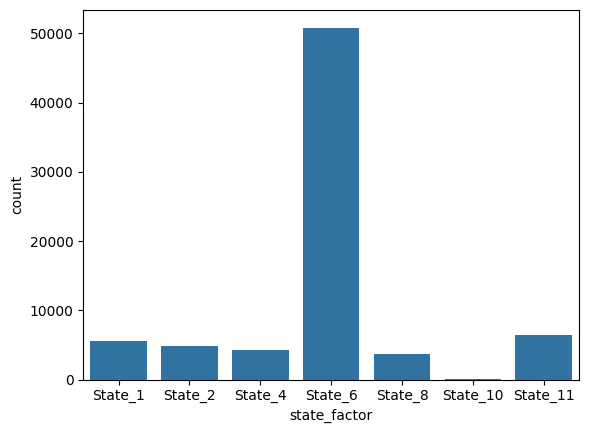

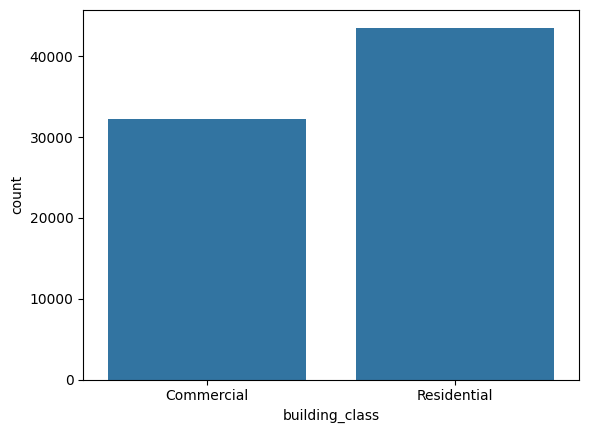

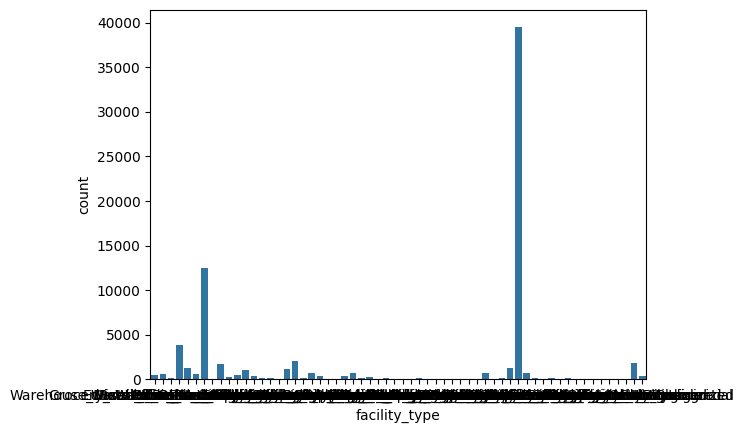

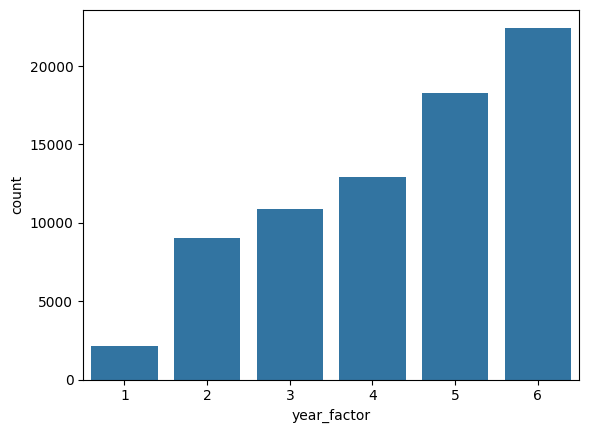

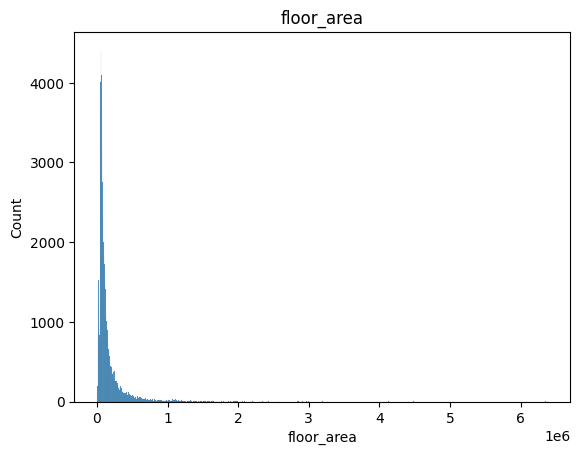

...

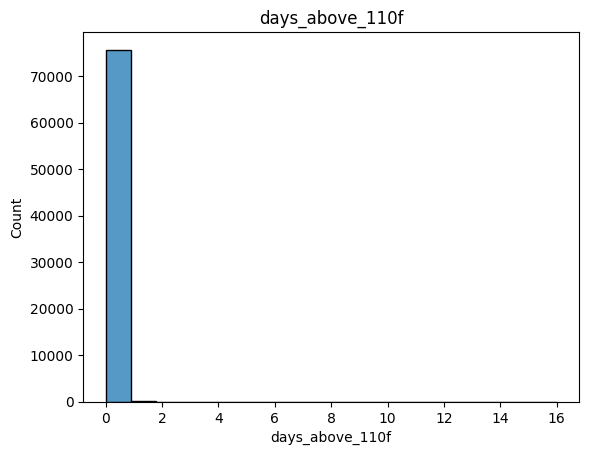

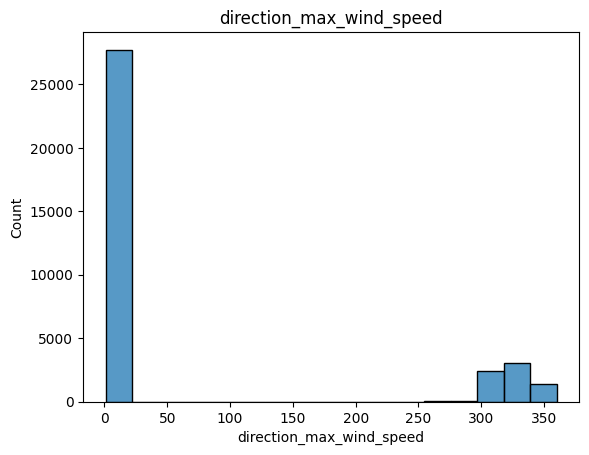

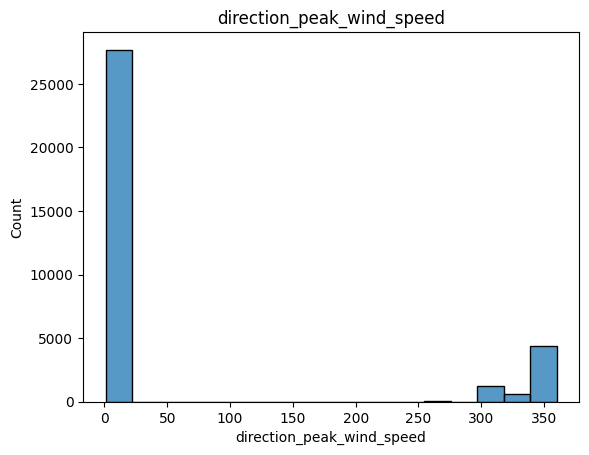

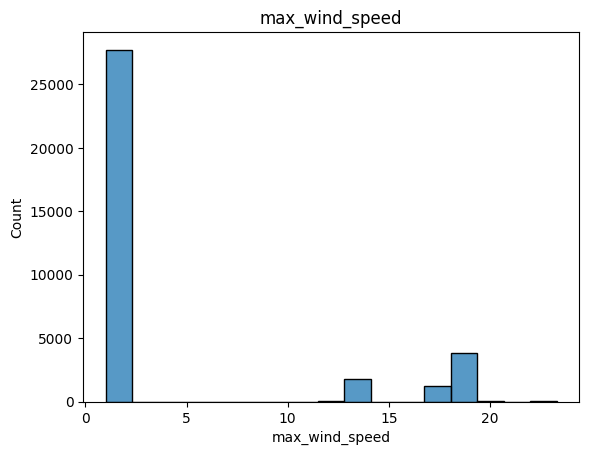

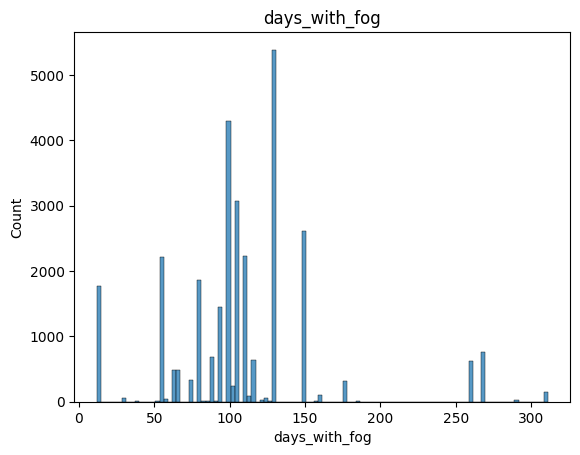

In [ ]:
# Classify columns by type (numerical, categorical, cardinal, etc. for downstream data processing)

def grab_col_names(dataframe, cat_th = 8, car_th = 62):
    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    return list(cat_cols), list(num_cols), list(cat_but_car)


cat_cols, num_cols, cat_but_car = grab_col_names(data)

def cat_summary(dataframe, col_name, plot = False):
    if plot:
        sns.countplot(x = dataframe[col_name], data = dataframe)
        plt.show(block = True)


for col in cat_cols:
    cat_summary(data, col, True)

def num_summary(dataframe, numerical_col, plot = False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]

    if plot:
        sns.histplot(dataframe[numerical_col])
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show(block = True)


for col in num_cols:
    num_summary(data, col, plot = True)

### **Feature Engineering - Outlier Detection and Removal**

In [ ]:
def outlier_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    return dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None)

rep_cols = ["floor_area", "elevation", "precipitation_inches", "snowfall_inches", "snowdepth_inches", "site_eui"]

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    modified_before = dataframe[(dataframe[variable] < low_limit) | (dataframe[variable] > up_limit)].shape[0]
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit
    return modified_before

total_rows = data.shape[0]
total_modified = sum(replace_with_thresholds(data, col) for col in rep_cols)
percentage_modified = (total_modified / total_rows) * 100

print(f"Percentage of data modified due to outliers: {percentage_modified:.2f}%")

Percentage of data modified due to outliers: 1.52%


### **Feature Engineering - Missing Values and Imputation**

In [ ]:
# Display percentage of missing values
pd.set_option('display.max_rows', None)

print("Percentage of Missing Values:")
# Percentage of missing values for each column
missing_values_percentage = data.isnull().mean() * 100

print(missing_values_percentage.sort_values(ascending=False), '\n')

Percentage of Missing Values:
days_with_fog                60.451179
direction_peak_wind_speed    55.190939
max_wind_speed               54.228652
direction_max_wind_speed     54.228652
energy_star_rating           35.256148
year_built                    2.424858
year_factor                   0.000000
november_max_temp             0.000000
cooling_degree_days           0.000000
december_max_temp             0.000000
december_avg_temp             0.000000
december_min_temp             0.000000
october_avg_temp              0.000000
november_avg_temp             0.000000
november_min_temp             0.000000
october_max_temp              0.000000
precipitation_inches          0.000000
october_min_temp              0.000000
heating_degree_days           0.000000
days_below_30f                0.000000
snowfall_inches               0.000000
snowdepth_inches              0.000000
avg_temp                      0.000000
september_avg_temp            0.000000
days_below_20f                0.00

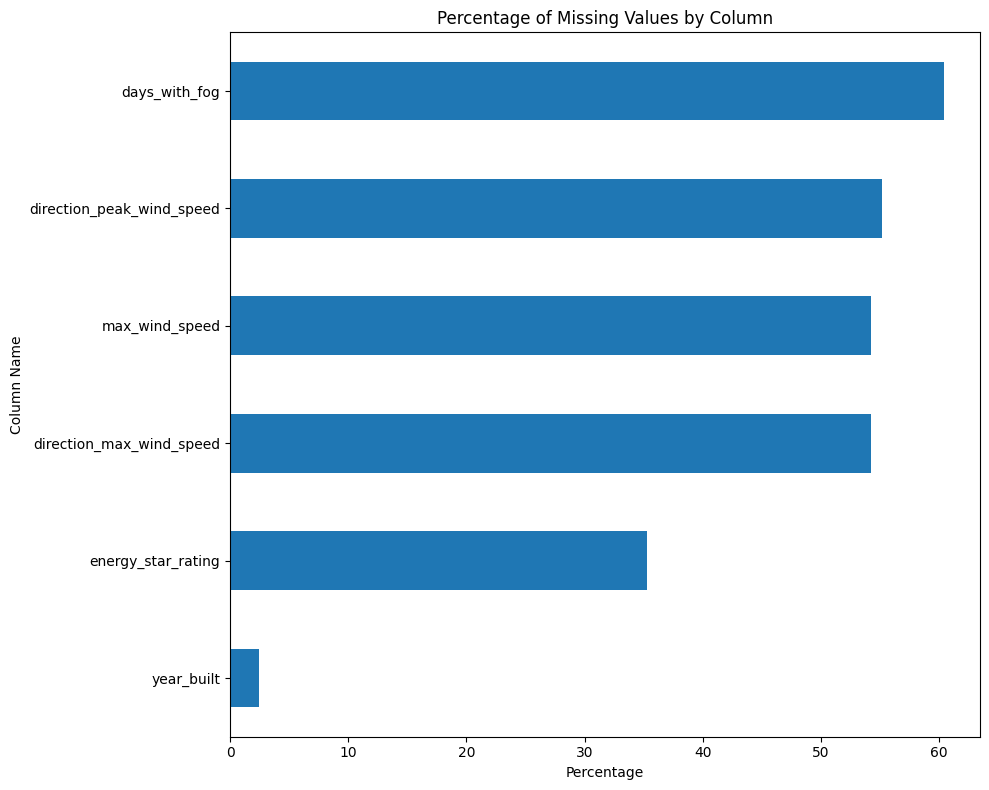

In [ ]:
# Plotting the percentage of missing values by column
plt.figure(figsize=(10, 8))
missing_values_percentage[missing_values_percentage > 0].sort_values().plot(kind='barh')
plt.title('Percentage of Missing Values by Column')
plt.xlabel('Percentage')
plt.ylabel('Column Name')

# Show plot
plt.tight_layout()
plt.show()

In [ ]:
def missing_values_table(dataframe, na_name = False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]

    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending = False)
    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending = False)
    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis = 1, keys = ['n_miss', 'ratio'])
    print(missing_df, end = "\n")

    if na_name:
        return na_columns, missing_df


na_cols, missing_df = missing_values_table(data, True)
drop_cols = missing_df[missing_df["ratio"] > 50].index
data.drop(columns=drop_cols, inplace=True)

data['year_built'] = data['year_built'].fillna(data.groupby('state_factor')['year_built'].transform('median'))
data.loc[data["year_built"] == 0, "year_built"] = 1938
data["year_built"] = data["year_built"].astype("int")

                           n_miss  ratio
days_with_fog               45796  60.45
direction_peak_wind_speed   41811  55.19
direction_max_wind_speed    41082  54.23
max_wind_speed              41082  54.23
energy_star_rating          26709  35.26
year_built                   1837   2.42


All columns with more than 50% missing values have been successfully dropped from the dataset. The columns removed are:

*   days_with_fog
*   direction_peak_wind_speed
*   direction_max_wind_speed
*   max_wind_speed
*   energy_star_rating


- The remaining numerical columns were imputed using the median, and missing values in categorical columns were filled with 'Unknown'. There are now no missing values left in the dataset.

Reasons for Median imputation for numerical columns::
- The median is less sensitive to outliers compared to the mean. In datasets where numerical values can be highly skewed or contain extreme outliers, using the median ensures that the imputed value is not disproportionately affected by these extreme values.

- The median provides a measure of the central tendency of the data that is more representative of the typical value in a skewed distribution.

- By using a value that is actually present in the data (for odd number of observations), the median helps maintain the integrity of the dataset's distribution, especially in cases where the data are not normally distributed.

reasons for "Unknown" imputation for categorical columns:
- Allows the preservation of information that the original data was missing. This can be important for analyses where the fact that data is missing could itself be informative.

- Imputing the most frequent category or using statistical methods to guess the missing category could introduce bias, especially if the missingness is not random. Using "Unknown" avoids making potentially incorrect assumptions about the data.

- Having an "Unknown" category allows for separate analysis of the missing data. Analysts can examine whether the patterns of missingness relate to other variables or outcomes, which can provide insights into the data collection process or the phenomenon being studied.

### **Feature Engineering - Features Transformation & Encoding**

In [ ]:
# Create Age Build
data["build_age"] = 2023 - data["year_built"]
data.drop(columns ="year_built", inplace = True)

# Create category using facility_type
def get_manual_facility_groups():
    facility_groups = {
        "Living_Space": {
            "2to4_Unit_Building",
            "5plus_Unit_Building",
            "Mixed_Use_Predominantly_Residential",
            "Multifamily_Uncategorized",
            "Mixed_Use_Commercial_and_Residential",
            "Mixed_Use_Predominantly_Commercial",
        },
        "Social_Institutions": {
            "Education_College_or_university",
            "Education_Other_classroom",
            "Education_Preschool_or_daycare",
            "Education_Uncategorized",
            "Health_Care_Inpatient",
            "Health_Care_Outpatient_Clinic",
            "Health_Care_Outpatient_Uncategorized",
            "Health_Care_Uncategorized",
            "Nursing_Home",
            "Religious_worship"
        },
        "Business_Commercial_Venues": {
            "Commercial_Other",
            "Commercial_Unknown",
            "Industrial",
            "Parking_Garage",
            "Food_Sales",
            "Food_Service_Other",
            "Food_Service_Restaurant_or_cafeteria",
            "Food_Service_Uncategorized",
            "Grocery_store_or_food_market",
            "Office_Bank_or_other_financial",
            "Office_Medical_non_diagnostic",
            "Office_Mixed_use",
            "Office_Uncategorized",
            "Retail_Enclosed_mall",
            "Retail_Strip_shopping_mall",
            "Retail_Uncategorized",
            "Retail_Vehicle_dealership_showroom",
            "Laboratory",
            "Data_Center",
            "Lodging_Dormitory_or_fraternity_sorority",
            "Lodging_Hotel",
            "Lodging_Other",
            "Lodging_Uncategorized",
        },
        "Public": {
            "Public_Assembly_Drama_theater",
            "Public_Assembly_Entertainment_culture",
            "Public_Assembly_Library",
            "Public_Assembly_Movie_Theater",
            "Public_Assembly_Other",
            "Public_Assembly_Recreation",
            "Public_Assembly_Social_meeting",
            "Public_Assembly_Stadium",
            "Public_Assembly_Uncategorized",
            "Public_Safety_Courthouse",
            "Public_Safety_Fire_or_police_station",
            "Public_Safety_Penitentiary",
            "Public_Safety_Uncategorized",
        },
        "Warehouse_Service": {
            "Warehouse_Distribution_or_Shipping_center",
            "Warehouse_Nonrefrigerated",
            "Warehouse_Refrigerated",
            "Warehouse_Selfstorage",
            "Warehouse_Uncategorized",
            "Service_Drycleaning_or_Laundry",
            "Service_Uncategorized",
            "Service_Vehicle_service_repair_shop",
        },
    }

    return facility_groups


facility_groups = get_manual_facility_groups()
data['category'] = data['facility_type'].apply(lambda x:
                                               next((category for category, values in facility_groups.items()
                                                     if x in values), None))
data.drop(columns = ["facility_type", "building_class"], inplace = True)

## Organize the energy_star_rating column according to the category column.
data['energy_star_rating'] = data['energy_star_rating']. \
    fillna(data.groupby(["state_factor", "category"])['energy_star_rating'].
           transform('median'))
data['energy_star_rating'] = data['energy_star_rating'].fillna(data["energy_star_rating"].median())

# Create annual minimum and maximum temperatures
temp_min_max = data.groupby("state_factor")["january_min_temp"].min().reset_index()
for i in data.columns[6:41]:
    if "_min_" in i:
        temp_min_max[i+"_for_state"] = data.groupby("state_factor")[i].min().values
    elif "_avg_" in i:
        temp_min_max[i+"_for_state"] = data.groupby("state_factor")[i].mean().values
    elif "_max_" in i:
        temp_min_max[i + "_for_state"] = data.groupby("state_factor")[i].max().values

temp_min_max["min_temp_for_state"] = temp_min_max.iloc[:, 1:].min(axis=1)
temp_min_max["max_temp_for_state"] = temp_min_max.iloc[:, 1:].max(axis=1)

data = pd.merge(data,
                temp_min_max[["state_factor", "min_temp_for_state", "max_temp_for_state"]],
                how ="left",
                on= "state_factor")

# Create Floor Area Product Elevation
data["floor_prod_elevation"] = data["floor_area"] * data["elevation"]

# One hot encode to create dummy columns
def one_hot_encoder(dataframe, categorical_cols, drop_first = True):
    dataframe = pd.get_dummies(dataframe, columns = categorical_cols, drop_first = drop_first, dtype = "int")
    return dataframe

ohe_cols = ["state_factor", "category"]
data = one_hot_encoder(data, ohe_cols)

# Drop the following columns because they are irrelavant to the fsite_eui
data.drop(columns = ["id", "year_factor", "energy_star_rating"], inplace=True)

### **EDA - Correlation with site_eui**

In [ ]:
# Compute the correlation matrix
correlation_matrix = data.corr()

# Filter the correlation matrix to only include correlations with the target variable
correlation_with_target = correlation_matrix['site_eui']

# Sort the correlation values (This gives us the top features that are positively correlated)
# correlation_with_target_sorted = correlation_with_target.sort_values(ascending=False)

# Sort the correlation values (This gives us the top features that are most hishgly correlated (absolute value))
correlation_with_target_abs_sorted = correlation_with_target.abs().sort_values(ascending=False)

correlation_with_target_abs_sorted

site_eui                        1.000000
january_min_temp                0.205581
january_avg_temp                0.192896
snowfall_inches                 0.182031
february_avg_temp               0.177831
state_factor_State_11           0.172785
february_min_temp               0.171963
heating_degree_days             0.168365
category_Warehouse_Service      0.160724
min_temp_for_state              0.159945
days_below_30f                  0.159196
july_avg_temp                   0.155821
march_avg_temp                  0.154490
march_min_temp                  0.154159
cooling_degree_days             0.146880
june_avg_temp                   0.142088
state_factor_State_6            0.141905
days_below_20f                  0.137273
august_avg_temp                 0.135070
snowdepth_inches                0.131156
april_min_temp                  0.129307
september_avg_temp              0.129241
april_avg_temp                  0.128994
july_min_temp                   0.127557
precipitation_in

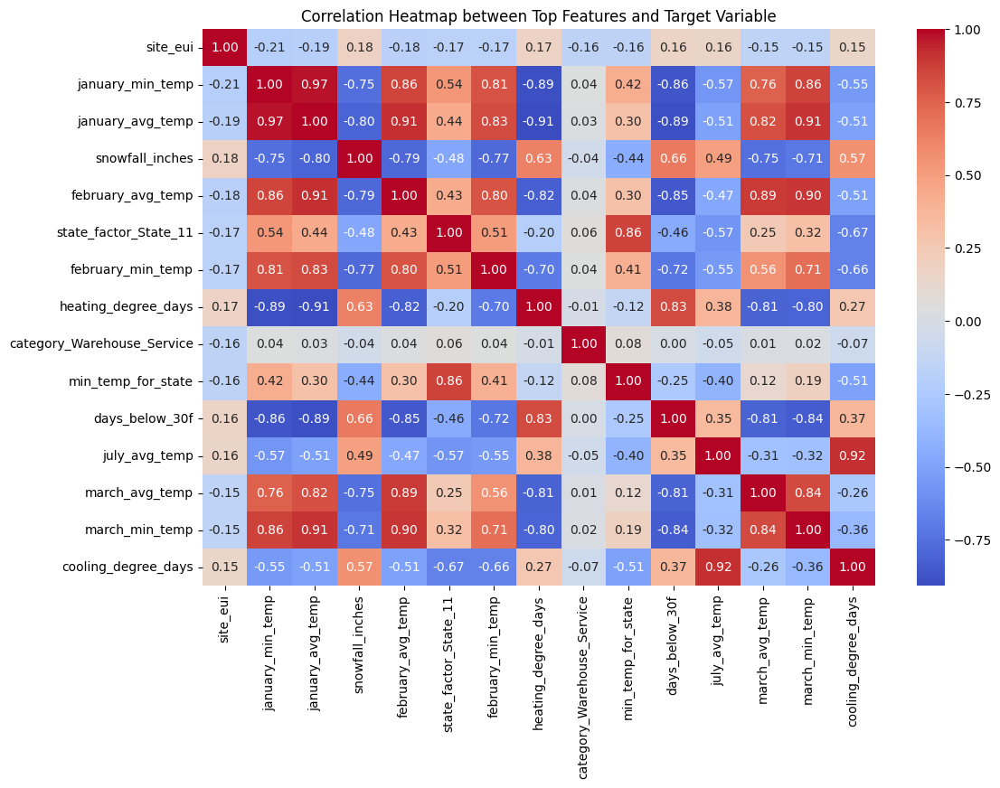

In [ ]:
# Look at the correlation for the top 15 features that are correlated
top_features = correlation_with_target_abs_sorted.head(15)

# Select the top 15 features' names
top_features_names = top_features.index

# Create a heatmap of the correlations between features and target variable
plt.figure(figsize=(12, 8))
sns.heatmap(data[top_features_names].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap between Top Features and Target Variable')
plt.show()


Based on the heat map, we could make our hypothesis that energy_star_rating is the most impacting feature to target variable site_eui.

**Drawing a heat map here to make hypothesis on what features are more important to target variable (correlation). Based on the data visualization, we could make some hypothesis on what features are more important to target variable.**

## **Model Engineering - GLM**

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

### **Baseline Model - Linear Regression Model**

In [ ]:
y = data[data['site_eui'].notna()]['site_eui']
y = np.log(y)
X = data[data['site_eui'].notna()].drop('site_eui', axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [ ]:
# Fit the linear regression model
linear_model = sm.OLS(y_train, X_train).fit()

# Print the summary of the linear regression model
print(linear_model.summary())

# Calculate the residuals
residuals = linear_model.resid

# Calculate the Mean Squared Error (MSE)
mse = np.mean(residuals**2)

# Calculate the R-squared value
r_squared = linear_model.rsquared

# Calculate the adjusted R-squared value
adj_r_squared = linear_model.rsquared_adj

# Print evaluation metrics
print("\nLinear Regression Model Evaluation:")
print("MSE:", mse)
print("R-squared:", r_squared)
print("Adjusted R-squared:", adj_r_squared)

                            OLS Regression Results                            
Dep. Variable:               site_eui   R-squared:                       0.188
Model:                            OLS   Adj. R-squared:                  0.187
Method:                 Least Squares   F-statistic:                     218.6
Date:                Wed, 06 Mar 2024   Prob (F-statistic):               0.00
Time:                        01:12:29   Log-Likelihood:                -54952.
No. Observations:               60605   AIC:                         1.100e+05
Df Residuals:                   60540   BIC:                         1.106e+05
Df Model:                          64                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
floor_area      

### **GLM - Gamma Regression Model**

*The* Gamma distribution is typically used to model with postive, non zeror continuous variable and skewed. Our dataset follows the same distribution.

In [ ]:
from statsmodels.formula.api import glm

# Construct the formula with all variables except 'site_eui' as predictors
predictors = [col for col in data.columns if col != 'site_eui']
formula = 'site_eui ~ ' + ' + '.join(predictors)

# data used here should be before normalization
model = sm.GLM.from_formula(formula, data=data, family=sm.families.Gamma()).fit()

print(model.summary())


/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


                 Generalized Linear Model Regression Results                  
Dep. Variable:               site_eui   No. Observations:                75757
Model:                            GLM   Df Residuals:                    75692
Model Family:                   Gamma   Df Model:                           64
Link Function:           InversePower   Scale:                         0.37926
Method:                          IRLS   Log-Likelihood:            -3.8666e+05
Date:                Wed, 06 Mar 2024   Deviance:                       24032.
Time:                        01:13:25   Pearson chi2:                 2.87e+04
No. Iterations:                   100   Pseudo R-squ. (CS):             0.1153
Covariance Type:            nonrobust                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

Both models still inadequate based on Deviance/Pearson chi2 and AIC/BIC.

## **Data Distributions and Normalization**

In [ ]:
# Standardize
standard_cols = [col for col in data.columns if col != 'site_eui']
ss = StandardScaler()
for col in standard_cols:
    data[col] = ss.fit_transform(data[[col]])

data['site_eui'] = np.log1p(data['site_eui'])
print(data.shape)
data.head()

(75757, 67)


,floor_area,elevation,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,february_max_temp,march_min_temp,march_avg_temp,...,state_factor_State_10,state_factor_State_11,state_factor_State_2,state_factor_State_4,state_factor_State_6,state_factor_State_8,category_Living_Space,category_Public,category_Social_Institutions,category_Warehouse_Service
0,-0.495551,-0.673323,2.618884,2.314092,1.670279,1.850925,1.698778,1.724835,1.838593,1.385627,...,-0.014073,-0.304081,-0.262137,-0.245308,-1.428417,-0.226634,-1.163089,-0.11507,-0.330400,-0.206350
1,0.565895,-0.684332,2.618884,2.314092,1.670279,1.850925,1.698778,1.724835,1.838593,1.385627,...,-0.014073,-0.304081,-0.262137,-0.245308,-1.428417,-0.226634,-1.163089,-0.11507,-0.330400,4.846146
2,0.595954,-0.684332,2.618884,2.314092,1.670279,1.850925,1.698778,1.724835,1.838593,1.385627,...,-0.014073,-0.304081,-0.262137,-0.245308,-1.428417,-0.226634,-1.163089,-0.11507,-0.330400,-0.206350
3,-0.525071,-0.684332,2.618884,2.314092,1.670279,1.850925,1.698778,1.724835,1.838593,1.385627,...,-0.014073,-0.304081,-0.262137,-0.245308,-1.428417,-0.226634,-1.163089,-0.11507,3.026639,-0.206350
4,-0.471813,-0.673323,2.618884,2.314092,1.670279,1.850925,1.698778,1.724835,1.838593,1.385627,...,-0.014073,-0.304081,-0.262137,-0.245308,-1.428417,-0.226634,-1.163089,-0.11507,-0.330400,4.846146


## **Model Engineering - Machine Learning Model**

### **Machine Learning Model Comparison**

In [ ]:
# the new_data should be after normalization
y = data[data['site_eui'].notna()]['site_eui']
X = data[data['site_eui'].notna()].drop('site_eui', axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17)

In [ ]:
# test the RMSE of different models
models = [('LR', LinearRegression()),
          ('KNN', KNeighborsRegressor()),
          ('CART', DecisionTreeRegressor(random_state = 17)),
          ('RF', RandomForestRegressor(random_state = 17)),
          ('GBM', GradientBoostingRegressor(random_state = 17)),
          ("XGBoost", XGBRegressor(eval_metric= "rmse", objective = 'reg:squarederror', random_state=17)),
          ("LightGBM", LGBMRegressor(metric= "rmse", objective='regression', random_state = 17)),
          ('ANN', MLPRegressor(random_state=17, max_iter=1000)),  # Adding ANN
          ('SVM', SVR())]

for name, regressor in models:
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X_train, y_train, cv = 5, scoring = "neg_mean_squared_error")))
    print(f"RMSE: {round(rmse, 4)} ({name}) ")

RMSE: 0.5782 (LR) 
RMSE: 0.5956 (KNN) 
RMSE: 0.6909 (CART) 
RMSE: 0.5278 (RF) 
RMSE: 0.558 (GBM) 
RMSE: 0.5389 (XGBoost) 
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3740
[LightGBM] [Info] Number of data points in the train set: 48484, number of used features: 65
[LightGBM] [Info] Start training from score 4.241842
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041935 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3762
[LightGBM] [Info] Number of data points in the train set: 48484, number of used features: 65
[LightGBM] [Info] Start training from score 4.241136
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 368

In [ ]:
# test the r-squared of different models
for name, regressor in models:
    r_squared = cross_val_score(regressor, X_train, y_train, cv=5, scoring="r2")
    mean_r_squared = np.mean(r_squared)
    print(f"R-squared: {round(mean_r_squared, 4)} ({name})")

R-squared: 0.1871 (LR)
R-squared: 0.1374 (KNN)
R-squared: -0.1607 (CART)
R-squared: 0.3227 (RF)
R-squared: 0.2429 (GBM)
R-squared: 0.2941 (XGBoost)
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3740
[LightGBM] [Info] Number of data points in the train set: 48484, number of used features: 65
[LightGBM] [Info] Start training from score 4.241842
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3762
[LightGBM] [Info] Number of data points in the train set: 48484, number of used features: 65
[LightGBM] [Info] Start training from score 4.241136
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Light

Since Random Forest Model has the lowest RMSE and highest R-squared, we decided to use Random Forest Model to find out the feature importance.

## **Model Engineering - Random Forest Model**

In [ ]:
# Random Forest Model with hyper-parameter tuning

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Define the parameter distributions for random search
param_dist = {
    'n_estimators': randint(100, 500),  # number of trees in the forest
    'max_depth': randint(3, 10),  # maximum depth of the trees
    'min_samples_split': randint(2, 10),  # minimum number of samples required to split an internal node
    'min_samples_leaf': randint(1, 5),  # minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt'],  # number of features to consider when looking for the best split (can remove this line)
    'bootstrap': [True, False]  # method of selecting samples for training each tree
}

# Initialize the Random Forest model
rf_model = RandomForestRegressor()

# Initialize RandomizedSearchCV with the defined parameter distributions and cross-validation settings
random_search = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=10, cv=5, scoring='neg_mean_squared_error', random_state=17)

# Perform hyperparameter tuning
random_search.fit(X_train, y_train)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:", random_search.best_params_)

# Get the best model from the random search
best_rf_model = random_search.best_estimator_

# Perform cross-validation with the best model
cv_scores = cross_val_score(best_rf_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

# Print the cross-validation scores (negative mean squared error)
print("\nCross-Validation Scores (Negative Mean Squared Error):")
print(cv_scores)

# Calculate the average cross-validation score (negative mean squared error)
avg_cv_score = cv_scores.mean()
print("\nAverage Cross-Validation Score (Negative Mean Squared Error):", avg_cv_score)


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors

Best Hyperparameters: {'bootstrap': True, 'max_depth': 8, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 6, 'n_estimators': 139}


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors


Cross-Validation Scores (Negative Mean Squared Error):
[-0.3020671  -0.30303341 -0.29939514 -0.30027574 -0.30917253]

Average Cross-Validation Score (Negative Mean Squared Error): -0.3027887833977226


In [ ]:
print("Best Hyperparameters:", random_search.best_params_)

Best Hyperparameters: {'bootstrap': True, 'max_depth': 8, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 6, 'n_estimators': 139}


In [ ]:
# Predict on training and test sets
y_pred_train = best_rf_model.predict(X_train)
y_pred_test = best_rf_model.predict(X_test)

# Calculate R-squared (R2) for training and test sets
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)

# Print R-squared
print(f"R-squared (Train): {r2_train:.2f}")
print(f"R-squared (Test): {r2_test:.2f}")

R-squared (Train): 0.30
R-squared (Test): 0.27


In [ ]:
# Calculate residuals for training and test sets
residuals_train = y_train - y_pred_train
residuals_test = y_test - y_pred_test

# Calculate Mean Squared Error (MSE) for training and test sets
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)

# Calculate Root Mean Squared Error (RMSE) for training and test sets
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)

# Calculate Mean Absolute Error (MAE) for training and test sets
# mae_train = mean_absolute_error(y_train, y_pred_train)
# mae_test = mean_absolute_error(y_test, y_pred_test)

# Print RMSE
print(f"RMSE (Train): {rmse_train:.2f}")
print(f"RMSE (Test): {rmse_test:.2f}")


RMSE (Train): 0.54
RMSE (Test): 0.55


After using RF to find the feature importance, we recalculate the RMSE and R-Square too see if there are any significant changes. It appears that there are not much differences so we will be using the model to define the feature importance.

## **Feature Interpretation**

### **Feature Importance - Random Forest Model**

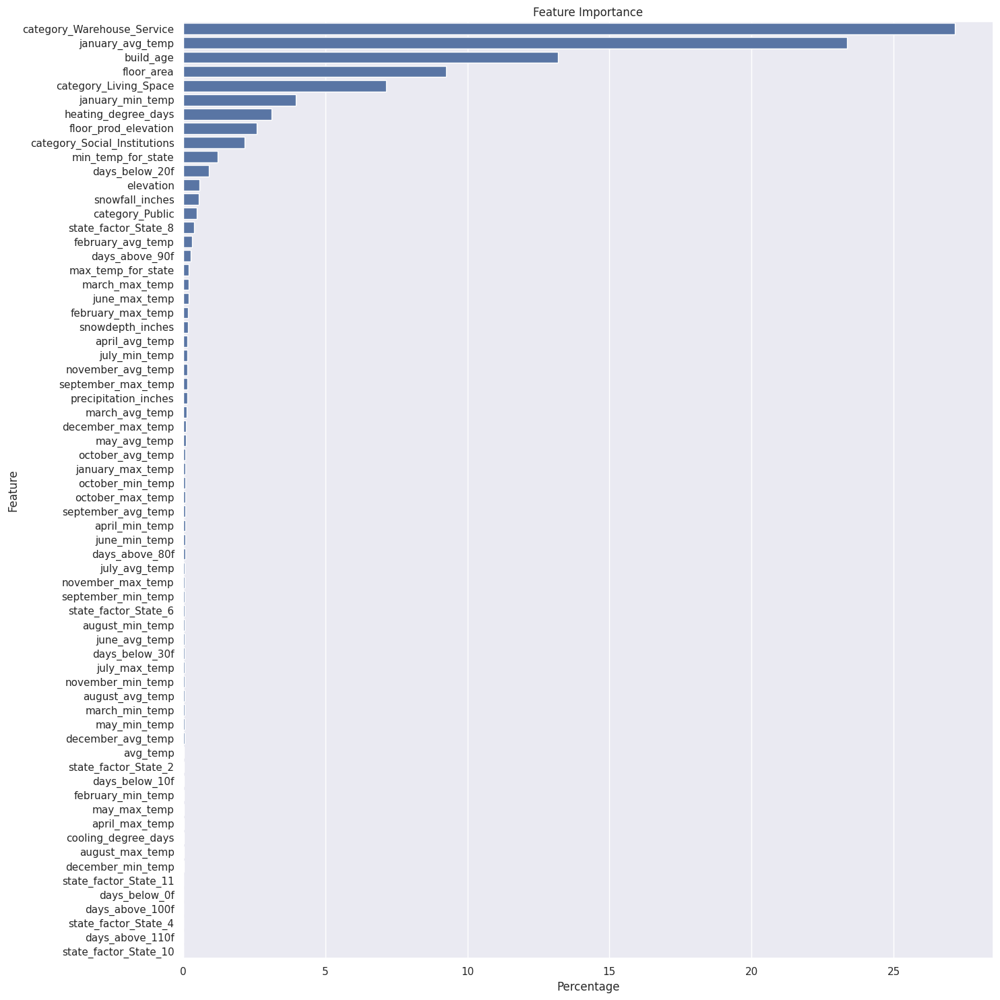

In [ ]:
# Define the final_model

final_model = best_rf_model

def plot_importance(model, features, num=len(X), save=False):
    # Calculate feature importance as a percentage
    feature_importance_percentage = (model.feature_importances_ / model.feature_importances_.sum()) * 100

    # Create a DataFrame to hold feature importance values and feature names
    feature_imp = pd.DataFrame({'Value': model.feature_importances_,
                                'Percentage': feature_importance_percentage,
                                'Feature': features.columns})

    # Sort the DataFrame by feature importance value
    feature_imp_sorted = feature_imp.sort_values(by="Value", ascending=False)

    # Plot the feature importance
    plt.figure(figsize=(15, 15))
    sns.set(font_scale=1)
    sns.barplot(x="Percentage", y="Feature", data=feature_imp_sorted[:num])
    plt.title('Feature Importance')
    plt.xlabel('Percentage')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()

plot_importance(final_model, X)

### **Feature Interpretation - LIME Method**

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=9d9bdbab6abc15212aed3e1d0608d53a7495ab4dfa77cad6c43cbafe0dc0e00a
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import lime
from lime import lime_tabular

# Create a LimeTabularExplainer
# Note: LimeTabularExplainer expects the training data to be in a numpy array, not a DataFrame
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),
                                              feature_names=X_train.columns.tolist(),
                                              class_names=['site_eui'],
                                              mode='regression')

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


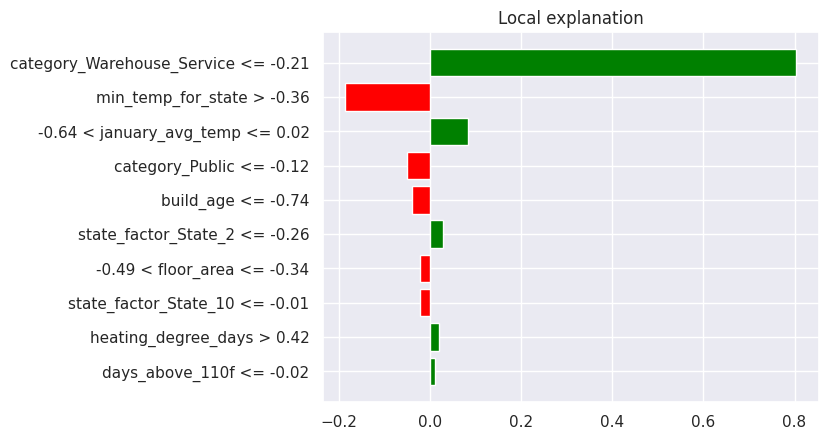

,0,1
0,category_Warehouse_Service <= -0.21,0.803774
1,min_temp_for_state > -0.36,-0.185848
2,-0.64 < january_avg_temp <= 0.02,0.083260
3,category_Public <= -0.12,-0.051425
4,build_age <= -0.74,-0.039127
5,state_factor_State_2 <= -0.26,0.027562
6,-0.49 < floor_area <= -0.34,-0.023114
7,state_factor_State_10 <= -0.01,-0.021596
8,heating_degree_days > 0.42,0.020529
9,days_above_110f <= -0.02,0.011280


In [ ]:
# Explain the prediction for a single instance from the test set
exp = explainer.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=best_rf_model.predict,
    num_features=10
)

# Visualize the explanation
exp.as_pyplot_figure()
plt.show()

pd.DataFrame(exp.as_list())

In [ ]:
exp.show_in_notebook(show_table=True, show_all=False)

**Blue Bars**: Indicate the features that have a negative impact on the prediction value, meaning they push the prediction value lower than it would be otherwise. The blue bars pointing to the left suggest that as these feature values increase, they contribute to a lower predicted target value.

**Orange Bars**: Indicate the features that have a positive impact on the prediction value, meaning they push the prediction value higher. The orange bars pointing to the right suggest that as these feature values increase, they contribute to a higher predicted target value.

*** Because these is a local explanation, we will run 5 more to evaluate the difference***


In [ ]:
num_instances_to_explain = 5

# Explain multiple instances from the test set
for i in range(num_instances_to_explain):
    instance = X_test.iloc[i]
    exp = explainer.explain_instance(
        data_row=instance,
        predict_fn=best_rf_model.predict
    )
    exp.show_in_notebook(show_table=True, show_all=False)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [ ]:
num_instances = X_test.shape[0]
print(f"The total number of instances in the test set is: {num_instances}")


The total number of instances in the test set is: 15152


**Since there are many isntances, here's an attempt t generalize them with SP-LIME**

In [ ]:
from lime.submodular_pick import SubmodularPick

# Ensure the feature names are consistent
feature_names = X_train.columns.tolist()

# Convert the numpy array back to a DataFrame with the correct feature names for LIME explainer
X_train_df = pd.DataFrame(np.array(X_train), columns=feature_names)

# Initialize the LIME explainer with correct feature names
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_df.values,
    feature_names=feature_names,
    class_names=['site_eui'],
    mode='regression'
)

# Define a wrapper function to ensure the input to the predict function is a DataFrame
def predict_fn(X):
    return best_rf_model.predict(pd.DataFrame(X, columns=feature_names))

# Create a SubmodularPick object using the same explainer
sp_obj = SubmodularPick(explainer, X_train_df.values, predict_fn, sample_size=200, num_features=63, num_exps_desired=80)

# Process the Submodular Pick explanations
feature_importances = np.zeros(len(feature_names))
for exp in sp_obj.sp_explanations:
    exp_map = exp.as_map()
    for feature_idx, values in exp_map.items():
        feature_importances[feature_idx] += np.sum([value for _, value in values])

# Normalize the importances
feature_importances /= len(sp_obj.sp_explanations)

# Map the feature indices to names and sort by importance
importance_dict = dict(zip(feature_names, feature_importances))
sorted_importance = sorted(importance_dict.items(), key=lambda x: x[1], reverse=True)

# Convert the sorted importances to a DataFrame for nicer display
importances_df = pd.DataFrame(sorted_importance, columns=['Feature', 'Importance'])

# Display the DataFrame
importances_df



,Feature,Importance
0,elevation,0.75875
1,january_min_temp,0.00000
2,january_avg_temp,0.00000
3,january_max_temp,0.00000
4,february_min_temp,0.00000
5,february_avg_temp,0.00000
6,february_max_temp,0.00000
7,march_min_temp,0.00000
8,march_avg_temp,0.00000
9,march_max_temp,0.00000


**LIME is not buit for generalization. The SP-LIME didnt work very well, so let's try to agregate the local predictions and get an average**

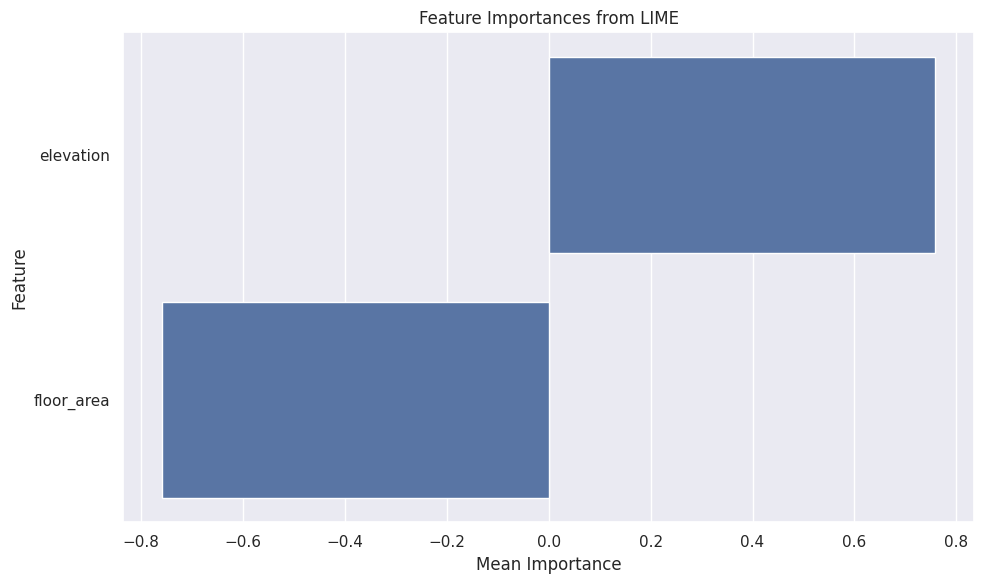

      Feature  Mean Importance
0   elevation          0.75875
1  floor_area         -0.75875


In [ ]:
from lime.lime_tabular import LimeTabularExplainer
from lime.submodular_pick import SubmodularPick


importance_dicts = []

# Iterate over the explanations and sum the importances for each feature
for exp in sp_obj.sp_explanations:
    exp_map = exp.as_map()
    importance_dict = {}

    for feature_idx, feature_values in exp_map.items():
        total_importance = sum(value for _, value in feature_values)
        feature_name = exp.domain_mapper.feature_names[feature_idx]
        importance_dict[feature_name] = total_importance
    # Append this explanation's importances to the list
    importance_dicts.append(importance_dict)

importance_data = pd.concat([pd.DataFrame.from_records([d]) for d in importance_dicts], ignore_index=True)
importance_data.fillna(0, inplace=True)

# Calculate the mean importance for each feature across all explanations
mean_importances = importance_data.mean().sort_values(ascending=False)

# Plot all features
mean_importances_df = pd.DataFrame(mean_importances).reset_index()
mean_importances_df.columns = ['Feature', 'Mean Importance']

plt.figure(figsize=(10, 6))
sns.barplot(x='Mean Importance', y='Feature', data=mean_importances_df)
plt.title('Feature Importances from LIME')
plt.tight_layout()
plt.show()

print(mean_importances_df)



### **Feature Interpretation - SHAP Method**

**Let's try to use SHAP for better global inference, since we know there are more than two important features**

In [ ]:
!pip install torch
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 4.7 MB/s eta 0:00:00


In [ ]:
import shap
import torch

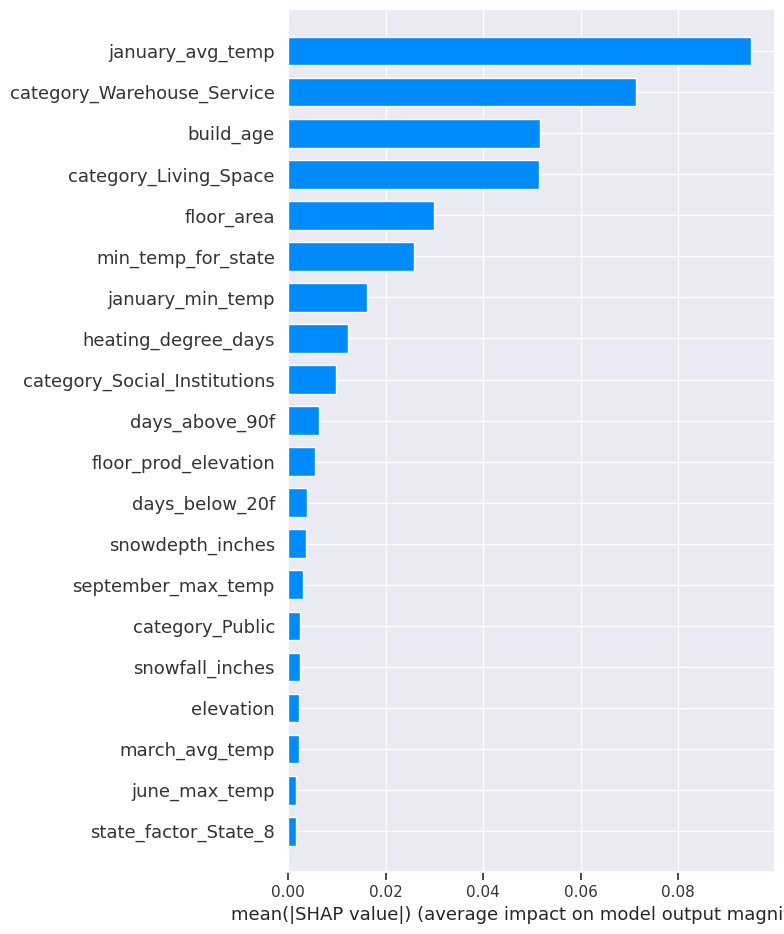

In [ ]:
shap.initjs()

explainer = shap.TreeExplainer(best_rf_model)
shap_values = explainer.shap_values(X_train)

shap.summary_plot(shap_values, X_test.sample(500), plot_type="bar")

# Visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[0,:], X_test.iloc[0,:])

# Local explanation for instance 1:

Applying global SHAP

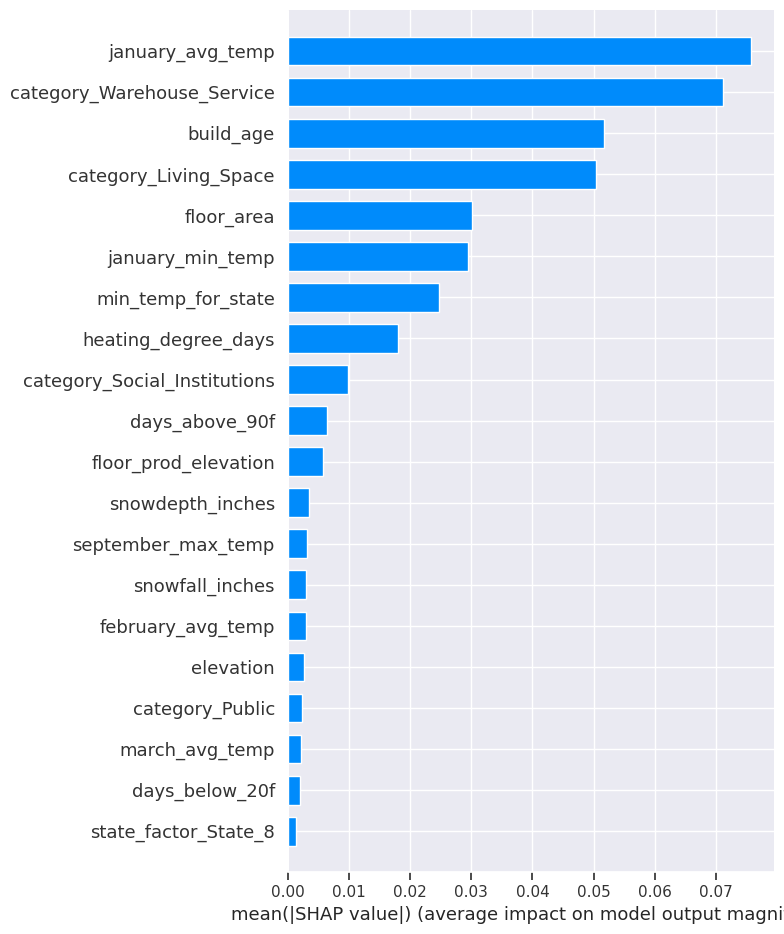

In [ ]:
explainer = shap.TreeExplainer(best_rf_model)
shap_values = explainer.shap_values(X_train)

shap.summary_plot(shap_values, X_train, plot_type='bar')

In [ ]:
shap_values_array = shap_values.values


global_importances = np.abs(shap_values_array).mean(axis=0)

feature_names = X_train.columns.tolist()
global_importances_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean SHAP Value': global_importances
})


global_importances_df.sort_values(by='Mean SHAP Value', ascending=False, inplace=True)

print(global_importances_df)

AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [ ]:
# Visualize the distribution of feature impact
shap.summary_plot(shap_values, X_train)


**Horizontal Direction**: Each point on the plot represents the SHAP value for a feature and an instance. The horizontal location shows the impact of the feature on the model's prediction for an instance. Points to the right of the vertical line (positive SHAP value) increase the prediction, while points to the left (negative SHAP value) decrease it.

**Where points are densely clustered, a feature has a more consistent impact on the prediction**. Sparse points suggest variability in the impact, depending on the instance.
